<div align='center'>

# Reduced Order Modelling (ROM)

### Part of Scientific-ML-Notes 

[![GitHub](https://img.shields.io/badge/GitHub-Repository-black?logo=github&scale=5)](https://github.com/mhnaderi/Scientific-ML-Notes)

---

In [1]:
# Always run this cell first to import all necessary libraries and to set up the notebook environment

import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

%matplotlib inline
%config InlineBackend.figure_format = 'svg'
plt.rcParams.update({"font.family": "serif", "figure.facecolor": 'white', "axes.facecolor": 'white'})

## Dynamic Mode Decomposition (DMD)

Dynamic Mode Decomposition (DMD) offers a powerful method for analyzing complex systems by decomposing data into modes that capture both spatial and temporal dynamics. Unlike Singular Value Decomposition (SVD) or Proper Orthogonal Decomposition (POD), which focus on spatial correlations and energy content while often neglecting temporal information, DMD identifies modes that maintain consistent linear behavior over time. Each DMD mode represents spatially correlated structures exhibiting dynamics such as oscillations at specific frequencies with growth or decay rates.

DMD not only reduces dimensionality by finding a set of dominant modes but also provides a model for how these modes evolve over time. Essentially, DMD can be seen as an algorithm that identifies the best-fit linear dynamical system that describes the evolution of high-dimensional measurements. By approximating the Koopman operator for the measured data, DMD is applicable to both experimental and numerical datasets without relying on explicit knowledge of the governing equations.

### Mathematical Formulation of DMD

DMD is fundamentally data-driven. The process begins by collecting sequential snapshots of a system's state as it evolves over time. These snapshots are uniformly sampled at a time-step $\Delta t$, which should be sufficiently small to capture the system's highest frequency dynamics. The snapshots are organized into two data matrices, $\mathbf{X}$ and $\mathbf{X}'$, as follows:

$$
\begin{aligned}
\mathbf{X} &= \left[ \begin{array}{cccc}
| & | & & | \\
\mathbf{x}(t_1) & \mathbf{x}(t_2) & \cdots & \mathbf{x}(t_s) \\
| & | & & |
\end{array} \right], \\
\mathbf{X}' &= \left[ \begin{array}{cccc}
| & | & & | \\
\mathbf{x}(t_2) & \mathbf{x}(t_3) & \cdots & \mathbf{x}(t_{s+1}) \\
| & | & & |
\end{array} \right],
\end{aligned}
$$

where each column $\mathbf{x}(t_k)$ represents the system state at time $t_k$.

The DMD algorithm seeks the leading eigenvalues and eigenvectors of the best-fit linear operator $\mathbf{A}$ that advances the system from one snapshot to the next:

$$
\mathbf{X}' \approx \mathbf{A} \mathbf{X}.
$$

This operator $\mathbf{A}$ provides a linear model that best captures the temporal evolution of the snapshots. The optimal operator $\mathbf{A}$ minimizes the difference between $\mathbf{X}'$ and $\mathbf{A}\mathbf{X}$ in the Frobenius norm sense:

$$
\mathbf{A} = \underset{\mathbf{A}}{\operatorname{argmin}} \left\| \mathbf{X}' - \mathbf{A} \mathbf{X} \right\|_F = \mathbf{X}' \mathbf{X}^\dagger,
$$

where $\mathbf{X}^\dagger$ denotes the pseudoinverse of $\mathbf{X}$.

When we use direct measurements of the state (i.e., $\mathbf{g}(\mathbf{x}) = \mathbf{x}$), the operator $\mathbf{A}$ approximates the Koopman operator restricted to a finite-dimensional subspace.

We are interested in the eigenvalues $\boldsymbol{\Lambda}$ and eigenvectors $\boldsymbol{\Phi}$ of $\mathbf{A}$ that satisfy:

$$
\mathbf{A} \boldsymbol{\Phi} = \boldsymbol{\Phi} \boldsymbol{\Lambda}.
$$

These eigenvalues and eigenvectors provide insight into the system's dynamics.

### DMD Algorithm

The DMD algorithm involves the following steps:

1. **Compute the Singular Value Decomposition (SVD) of $\mathbf{X}$:**

   $$
   \mathbf{X} \approx \tilde{\mathbf{U}} \tilde{\mathbf{\Sigma}} \tilde{\mathbf{V}}^T,
   $$

   where $\tilde{\mathbf{U}}$, $\tilde{\mathbf{\Sigma}}$, and $\tilde{\mathbf{V}}$ are the truncated left singular vectors, singular values, and right singular vectors, respectively, capturing the leading $r$ modes.

2. **Compute the Reduced Operator $\tilde{\mathbf{A}}$:**

   Instead of directly computing the potentially large matrix $\mathbf{A}$, we project $\mathbf{A}$ onto the reduced subspace spanned by the columns of $\tilde{\mathbf{U}}$:

   $$
   \tilde{\mathbf{A}} = \tilde{\mathbf{U}}^T \mathbf{A} \tilde{\mathbf{U}} = \tilde{\mathbf{U}}^T \mathbf{X}' \tilde{\mathbf{V}} \tilde{\mathbf{\Sigma}}^{-1}.
   $$

   This reduced-order matrix $\tilde{\mathbf{A}}$ captures the essential dynamics and has the same non-zero eigenvalues as $\mathbf{A}$. It defines a linear model for the evolution of the reduced state vector $\tilde{\mathbf{x}}$:

   $$
   \tilde{\mathbf{x}}_{k+1} = \tilde{\mathbf{A}} \tilde{\mathbf{x}}_k,
   $$

   where $\tilde{\mathbf{x}}_k = \tilde{\mathbf{U}}^T \mathbf{x}_k$. The original state $\mathbf{x}_k$ can be reconstructed as $\mathbf{x}_k = \tilde{\mathbf{U}} \tilde{\mathbf{x}}_k$.

3. **Compute the Eigen-Decomposition of $\tilde{\mathbf{A}}$:**

   $$
   \tilde{\mathbf{A}} \mathbf{W} = \mathbf{W} \boldsymbol{\Lambda},
   $$

   where $\boldsymbol{\Lambda}$ contains the DMD eigenvalues, and $\mathbf{W}$ contains the corresponding eigenvectors of $\tilde{\mathbf{A}}$. These eigenvalues and eigenvectors characterize how the modes evolve over time.

4. **Reconstruct the High-Dimensional DMD Modes $\boldsymbol{\Phi}$:**

   The DMD modes in the original high-dimensional space are reconstructed using:

   $$
   \boldsymbol{\Phi} = \mathbf{X}' \tilde{\mathbf{V}} \tilde{\mathbf{\Sigma}}^{-1} \mathbf{W}.
   $$

   These modes $\boldsymbol{\Phi}$ are eigenvectors of the full operator $\mathbf{A}$ and are associated with the eigenvalues in $\boldsymbol{\Lambda}$. They represent spatial structures linked to specific temporal behaviors.

### Spectral Decomposition and DMD Expansion

A significant advantage of DMD is its ability to express the system's state at any time step as a combination of dynamic modes with corresponding temporal evolution. The state at time step $k$ can be expanded as:

$$
\mathbf{x}_k = \boldsymbol{\Phi} \boldsymbol{\Lambda}^{k-1} \mathbf{b} = \left[ \begin{array}{ccc}
| & & | \\
\boldsymbol{\phi}_1 & \cdots & \boldsymbol{\phi}_r \\
| & & |
\end{array} \right] \left[ \begin{array}{ccc}
\lambda_1^{k-1} & & \\
& \ddots & \\
& & \lambda_r^{k-1}
\end{array} \right] \left[ \begin{array}{c}
b_1 \\
\vdots \\
b_r
\end{array} \right],
$$

where:

- $\boldsymbol{\phi}_j$ are the DMD modes (columns of $\boldsymbol{\Phi}$),
- $\lambda_j$ are the DMD eigenvalues,
- $b_j$ are mode amplitudes determined from initial conditions.

The mode amplitudes $\mathbf{b}$ can be computed using the initial state. At time $k = 1$:

$$
\mathbf{x}_1 = \boldsymbol{\Phi} \mathbf{b} \implies \mathbf{b} = \boldsymbol{\Phi}^\dagger \mathbf{x}_1,
$$

where $\boldsymbol{\Phi}^\dagger$ is the pseudoinverse of $\boldsymbol{\Phi}$.

Alternatively, using the reduced variables:

$$
\begin{aligned}
\tilde{\mathbf{x}}_1 &= \tilde{\mathbf{U}}^T \mathbf{x}_1 = \tilde{\mathbf{U}}^T \boldsymbol{\Phi} \mathbf{b} = (\tilde{\mathbf{U}}^T \boldsymbol{\Phi}) \mathbf{b}, \\
\implies \mathbf{b} &= (\tilde{\mathbf{U}}^T \boldsymbol{\Phi})^{-1} \tilde{\mathbf{x}}_1 = (\mathbf{W} \boldsymbol{\Lambda})^{-1} \tilde{\mathbf{x}}_1.
\end{aligned}
$$

This spectral expansion allows us to predict future states by extrapolating the temporal evolution encoded in the eigenvalues $\boldsymbol{\Lambda}$.

The spectral expansion can also be expressed in continuous time. To transition from discrete to continuous time, we define:

$$
\boldsymbol{\Omega} = \frac{\log(\boldsymbol{\Lambda})}{\Delta t},
$$

where $\boldsymbol{\Omega}$ contains the continuous-time eigenvalues. The state at continuous time $t$ is then:

$$
\mathbf{x}(t) = \boldsymbol{\Phi} \exp(\boldsymbol{\Omega} t) \mathbf{b}.
$$

This formulation is useful for systems where continuous-time predictions are desired.

By capturing both spatial modes and their temporal dynamics, DMD serves as a valuable tool for analyzing complex systems, enabling dimensionality reduction and providing insights into the underlying processes governing the system's behavior.

In [2]:
# Parameters
c, nu = 0, 0.05  # Advection speed and diffusion coefficient
N = 2**8  # Number of grid points
dt, Tf = 1e-3, 1  # Time step and final time
r = 10  # Number of modes to retain

# Time evaluation points
t_eval = np.arange(0, Tf, dt)

# Finite difference grid
def Grid_FD(Xmin, Xmax, N, bc_left, bc_right):
    xp = np.linspace(Xmin, Xmax, N)

    dx = xp[1]-xp[0]

    D1 = (                 -   np.eye(N, k=-1)               +   np.eye(N, k=1)                 )/(2*dx   )
    D2 = (                     np.eye(N, k=-1) - 2*np.eye(N) +   np.eye(N, k=1)                 )/(dx**2  )
    D3 = (-np.eye(N, k=-2) + 2*np.eye(N, k=-1)               - 2*np.eye(N, k=1) + np.eye(N, k=2))/(2*dx**3)
    D4 = ( np.eye(N, k=-2) - 4*np.eye(N, k=-1) + 6*np.eye(N) - 4*np.eye(N, k=1) + np.eye(N, k=2))/(dx**4  )

    if bc_left  =='D': D1[ 0], D2[ 0] = 0, 0
    if bc_right =='D': D1[-1], D2[-1] = 0, 0
    if bc_left  =='P': 
        D1[0,-1] = -1/(2*dx ) 
        D2[0,-1] =  1/(dx**2) 
        D3[0,-2] =  1/(2*dx**3); D3[0,-1] = -2/(2*dx**3); D3[1,-1] = 1/(2*dx**3)
        D4[0,-2] =  1/(dx**4  ); D4[0,-1] = -4/(dx**4  ); D4[1,-1] = 1/(dx**4  )
    if bc_right =='P':
        D1[-1,0] =  1/(2*dx )
        D2[-1,0] =  1/(dx**2)
        D3[-1,1] = -1/(2*dx**3); D3[-1,0] =  2/(2*dx**3); D3[-2,0] = -1/(2*dx**3)
        D4[-1,1] =  1/(dx**4  ); D4[-1,0] = -4/(dx**4  ); D4[-2,0] =  1/(dx**4 )

    return D1, D2, D3, D4, xp, dx

# Generate finite difference matrices and grid points
D1, D2, _, _, xp, dx = Grid_FD(-1, 1, N, "P", "P")

# Define the right-hand side (RHS) of the PDE
RHS = lambda t, u: -c * D1 @ u + nu * D2 @ u

# Initial condition
u = np.sin(2 * np.pi * xp)

# Solve the PDE using solve_ivp
Snapshot = solve_ivp(RHS, (0, Tf), u, method='RK45', t_eval=t_eval).y

# Prepare data matrices for DMD
X, X_prime = Snapshot[:, :-1], Snapshot[:, 1:]

# Step 1: Singular Value Decomposition (SVD)
U, S, YT = np.linalg.svd(X, full_matrices=False)
Ur, Sigmar, YTr = U[:, :r], np.diag(S[:r]), YT[:r, :]

# Step 2: Compute A_tilde
A_tilde = np.linalg.solve(Sigmar.T, (Ur.T @ X_prime @ YTr.T).T).T

# Step 3: Eigen decomposition of A_tilde
Lambda, W = np.linalg.eig(A_tilde)
Lambda = np.diag(Lambda)

# Step 4: Compute DMD modes
Phi = X_prime @ np.linalg.solve(Sigmar.T, YTr).T @ W

# Initial condition for prediction
b = np.linalg.solve(W @ Lambda, Sigmar @ YTr[:, 0])

# Predict future state
u_pred = Phi @ np.exp(np.log(Lambda) / dt * Tf) @ b

# Plotting
fig, axs = plt.subplots(1, 2, figsize=(8, 4), tight_layout=True)

# Contour plot of the true solution
X, T = np.meshgrid(xp, t_eval)
axs[0].contourf(X, T, Snapshot.T, 100, cmap='bwr')
axs[0].set_xlabel('$x$')
axs[0].set_ylabel('$t$')
axs[0].set_title('Contour plot of true solution')

# Plot of the predicted vs true solution at final time
axs[1].plot(xp, Snapshot[:, -1], 'b-', label='True')
axs[1].plot(xp, u_pred, 'r--', label='Predicted')
axs[1].set_xlabel('$x$')
axs[1].set_ylabel('$u$')
axs[1].legend()
axs[1].set_title('Predicted vs true solution at $t=T_f$')

plt.show()

/var/folders/wg/4qh4wrxs07527dd791lnfmmh0000gn/T/ipykernel_16030/2827534734.py:69: RuntimeWarning: divide by zero encountered in log
  u_pred = Phi @ np.exp(np.log(Lambda) / dt * Tf) @ b


### Challenges and Limitations of DMD

- **Sensitivity to Noisy Data:** Dynamic Mode Decomposition (DMD) is notably sensitive to noise in the input data. The presence of noise can lead to significant and systematic biases in the computed eigenvalues, which adversely affects the accuracy and reliability of the modal decomposition.

- **Limitations with Traveling Waves:** DMD relies on the Singular Value Decomposition (SVD) of a data matrix $\mathbf{X}$, where each column represents spatial measurements at a specific time. This approach effectively separates space and time, capturing spatial modes in the columns of $\mathbf{U}$ and temporal dynamics in the columns of $\mathbf{Y}$. However, for systems that exhibit traveling waves—where patterns move through space over time—this separation of variables is inadequate. Similar to Proper Orthogonal Decomposition (POD), DMD struggles with accurately representing traveling waves because the assumption of separable spatial and temporal modes does not hold in such cases.

- **Challenges with Transient Dynamics:** Many complex systems are characterized by transient behaviors and intermittent phenomena that are critical to their overall dynamics. While methods like multiresolution DMD and the utilization of delay coordinates have been introduced to identify and analyze these events, selecting appropriate timescales and determining the optimal window sizes for DMD computations remains a challenge. Without a formalized method for these choices, capturing transient dynamics accurately is difficult.

- **Handling Nonlinearity:** Although DMD can effectively characterize periodic and quasi-periodic behavior in nonlinear systems—provided there is sufficient data—it inherently relies on linear measurements of the system. This reliance on linearity means that standard DMD may not capture truly nonlinear phenomena such as transients, intermittent events, broadband frequency interactions, multiple fixed points, unstable periodic orbits, or chaotic dynamics. To address this limitation, the extended DMD (eDMD) algorithm extends the standard approach by incorporating nonlinear functions of the system's state into the measurements. By enriching the measurement space with these nonlinear observables, eDMD provides a more robust basis to approximate the Koopman operator and better capture complex nonlinear behaviors.

## Proper Orthogonal Decomposition (POD)

Proper Orthogonal Decomposition (POD) is a model reduction technique used to simplify complex systems described by partial differential equations (PDEs). It achieves this by approximating the high-dimensional state space with a lower-dimensional subspace spanned by a set of orthogonal basis functions.

Consider a generic system of nonlinear PDEs:

$$
\dot{\mathbf{u}}(\mathbf{x}, t) = \mathbf{f}(\mathbf{u}(\mathbf{x}, t)),
$$

where:

- $\mathbf{u}(\mathbf{x}, t) \in \mathbb{R}^N$ is the state vector, dependent on spatial coordinates $\mathbf{x}$ and time $t$.
- $\mathbf{f}(\cdot)$ is a nonlinear function representing the system dynamics.
- $\dot{\mathbf{u}}$ denotes the time derivative of $\mathbf{u}$.

### POD Approximation

The foundational assumption of the POD method is that the state vector $\mathbf{u}(\mathbf{x}, t)$ can be approximated using a linear combination of a finite number of orthogonal spatial basis functions, separated from their temporal evolution:

$$
\mathbf{u}(\mathbf{x}, t) \approx \boldsymbol{\Phi}(\mathbf{x}) \boldsymbol{\theta}(t),
$$

where:

- $\boldsymbol{\Phi}(\mathbf{x}) \in \mathbb{R}^{N \times r}$ is the matrix of spatial basis functions (POD modes). Each column $\boldsymbol{\phi}_i(\mathbf{x})$ represents a mode, and $r$ is the number of retained modes, with $r \ll N$.
- $\boldsymbol{\theta}(t) \in \mathbb{R}^r$ is the vector of temporal coefficients corresponding to the modes.

### Derivation of the Reduced-Order Model

Substituting the POD approximation into the original PDE yields:

$$
\boldsymbol{\Phi}(\mathbf{x}) \, \dot{\boldsymbol{\theta}}(t) = \mathbf{f}\big(\boldsymbol{\Phi}(\mathbf{x}) \boldsymbol{\theta}(t)\big).
$$

To derive a reduced-order model (ROM), we leverage the orthogonality of the POD basis functions, which satisfy:

$$
\boldsymbol{\Phi}^\top \boldsymbol{\Phi} = \mathbf{I},
$$

where $\mathbf{I}$ is the identity matrix of size $r \times r$. Projecting the PDE onto the POD basis functions by multiplying both sides with $\boldsymbol{\Phi}^\top$ gives:

$$
\dot{\boldsymbol{\theta}}(t) = \boldsymbol{\Phi}^\top \mathbf{f}\big(\boldsymbol{\Phi} \boldsymbol{\theta}(t)\big).
$$

This equation represents the reduced-order model, substantially decreasing the computational complexity by reducing the dimensionality from $N$ to $r$.

#### Linear Case

If the function $\mathbf{f}(\cdot)$ is linear, such that $\mathbf{f}(\mathbf{u}) = \mathbf{L} \mathbf{u}$ for some matrix $\mathbf{L} \in \mathbb{R}^{N \times N}$, the ROM simplifies further:

$$
\dot{\boldsymbol{\theta}}(t) = \boldsymbol{\Phi}^\top \mathbf{L} \boldsymbol{\Phi} \, \boldsymbol{\theta}(t) = \mathbf{A} \, \boldsymbol{\theta}(t),
$$

where:

- $\mathbf{A} = \boldsymbol{\Phi}^\top \mathbf{L} \boldsymbol{\Phi} \in \mathbb{R}^{r \times r}$ is the reduced-order system matrix.

The solution to this system can be obtained by integrating the system of ordinary differential equations (ODEs) defined by $\mathbf{A}$.

### POD Basis Functions

The choice of basis functions $\boldsymbol{\Phi}(\mathbf{x})$ is critical to the accuracy of the POD approximation.

#### Generic Basis Functions

Any set of orthonormal basis functions can serve as POD modes. Common examples include:

- **Fourier Series:** Suitable for problems with periodic boundary conditions.
- **Chebyshev Polynomials:** Useful for approximating functions in finite intervals.
- **Legendre Polynomials:** Often used in problems defined over symmetric domains.

However, generic basis functions may not capture the specific features of the solution if it does not reside within their span, potentially leading to significant approximation errors.

#### Tailored Basis Functions via Snapshot Method

To create basis functions tailored to the specific system, the snapshot method is employed:

1. **Data Collection:**

   Collect snapshots of the system state at different time instances:

   $$
   \mathbf{X} = \left[ \mathbf{u}(\mathbf{x}, t_1), \mathbf{u}(\mathbf{x}, t_2), \dots, \mathbf{u}(\mathbf{x}, t_s) \right] \in \mathbb{R}^{N \times s},
   $$

   where $s$ is the number of snapshots.

2. **Singular Value Decomposition (SVD):**

   Perform SVD on the snapshot matrix $\mathbf{X}$:

   $$
   \mathbf{X} = \mathbf{U} \boldsymbol{\Sigma} \mathbf{V}^\top,
   $$

   where:

   - $\mathbf{U} \in \mathbb{R}^{N \times r}$ contains the left singular vectors (POD modes) corresponding to the $r$ largest singular values.
   - $\boldsymbol{\Sigma} \in \mathbb{R}^{r \times r}$ is a diagonal matrix of the largest singular values, representing the energy captured by each mode.
   - $\mathbf{V} \in \mathbb{R}^{s \times r}$ contains the right singular vectors.

3. **Basis Function Selection:**

   The columns of $\mathbf{U}$ form the tailored POD basis functions $\boldsymbol{\Phi}(\mathbf{x})$. By selecting the modes corresponding to the largest singular values, we ensure that the most energetically significant features of the system are captured.

The tailored basis functions derived from the data snapshots enhance the generalizability and accuracy of the POD approximation, as they are specifically adapted to the dynamics of the system being studied.

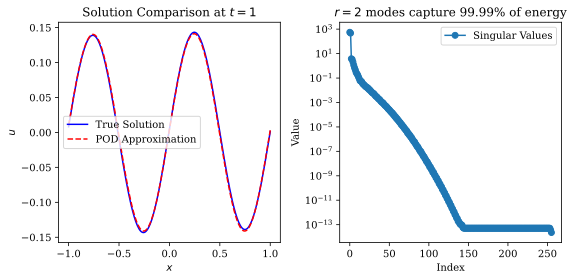

In [3]:
# Parameters
c = 1  # Advection speed
N = 2**8  # Number of grid points
dt, Tf = 1e-3, 1  # Time step and final time
t_eval = np.arange(0, Tf, dt)  # Time evaluation points

# Generate finite difference matrices and grid points
D1, D2, _, _, xp, dx = Grid_FD(-1, 1, N, "P", "P")

# Initial condition
u0 = np.sin(2 * np.pi * xp)

# Define the right-hand side (RHS) of the PDE
RHS = lambda t, u, nu: -c * D1 @ u + nu * D2 @ u

# Discretize nu and generate snapshots
Snapshots = []
for nu in np.linspace(0.01, 0.05, 10):
    Snapshot = solve_ivp(RHS, (0, Tf), u0, args=(nu,), method='RK45', t_eval=t_eval).y
    Snapshots.append(Snapshot.copy())

# Perform Singular Value Decomposition (SVD)
U, S, _ = np.linalg.svd(np.hstack(Snapshots), full_matrices=False)

# Truncate basis based on 99.99% energy
energy = np.cumsum(S**2) / np.sum(S**2)
r = np.searchsorted(energy, 0.9999) + 1
Phi = U[:, :r]

# Reduced-order RHS function
RHS_r = lambda t, theta, nu: -c * Phi.T @ D1 @ Phi @ theta + nu * Phi.T @ D2 @ Phi @ theta

# Solve for a new nu
nu_new = 0.05  # Example new nu
theta0 = Phi.T @ u0
theta = solve_ivp(RHS_r, (0, Tf), theta0, args=(nu_new,), method='RK45', t_eval=t_eval).y
u_reconstructed = Phi @ theta

# Calculate error for a specific time frame
time_frame = -1  # Last time frame
u_true = solve_ivp(RHS, (0, Tf), u0, args=(nu_new,), method='RK45', t_eval=[t_eval[time_frame]]).y.flatten()

# Plotting
fig, axs = plt.subplots(1, 2, figsize=(8, 4), tight_layout=True)

# Plot of the true solution vs POD approximation
axs[0].plot(xp, u_true, 'b-', label='True Solution')
axs[0].plot(xp, u_reconstructed[:, time_frame], 'r--', label='POD Approximation')
axs[0].set_xlabel('$x$')
axs[0].set_ylabel('$u$')
axs[0].set_title(f'Solution Comparison at $t={Tf}$')
axs[0].legend()

# Plot of the singular values
axs[1].semilogy(S, 'o-', label='Singular Values')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Value')
axs[1].set_title(f'$r={r}$ modes capture 99.99% of energy')
axs[1].legend()

plt.show()

### Challenges and Limitations of POD

Despite its effectiveness, POD faces several challenges:

#### Linear Parametric Space

POD relies on the assumption that the solution space can be adequately captured by a linear combination of a finite number of orthogonal basis functions. However, when the true solution exhibits complex, nonlinear behavior lying outside the span of these linear bases, the POD approximation may fail to capture essential dynamics, leading to inaccuracies.

#### Handling Rotations and Translations

The underlying SVD algorithm used in POD does not optimally handle invariances such as rotations and translations inherent in the data:

- **Translational Invariance:** Common in phenomena like wave propagation, where the solution translates in space over time. POD may require a large number of modes to represent such dynamics accurately.
- **Rotational Invariance:** Similar issues arise when the system exhibits rotational symmetry or periodicity.

These limitations stem from the global nature of the POD modes, which may not adapt well to localized or moving features in the solution.

### Overcoming the Kolmogorov Barrier

The "Kolmogorov Barrier" refers to the challenge of representing solutions to PDEs with inherently high-dimensional attractors using low-dimensional models. To break through this barrier and enhance the POD approach, several strategies can be employed.

#### Nonlinear Parametric Spaces

Instead of restricting the approximation to a linear subspace, we can utilize nonlinear manifolds to capture more complex system behaviors. Machine learning, particularly deep learning, offers tools to learn such nonlinear representations:

- **Neural Networks for State Mapping:**

  Use neural networks to learn mappings between high-fidelity simulation data and a reduced representation:

  $$
  \begin{aligned}
  \mathbf{a}_k &= \boldsymbol{\Psi}_{\boldsymbol{\theta}}(\mathbf{u}_k), \\
  \mathbf{a}_{k+1} &= \mathbf{f}_{\boldsymbol{\theta}}(\mathbf{a}_k),
  \end{aligned}
  $$

  where:

  - $\mathbf{a}_k$ is the reduced representation at time step $k$.
  - $\boldsymbol{\Psi}_{\boldsymbol{\theta}}$ is a neural network parameterized by weights $\boldsymbol{\theta}$.
  - $\mathbf{f}_{\boldsymbol{\theta}}$ models the evolution in the reduced space.

#### Time-Dependent Basis (Local Basis in Time)

Since POD basis functions are typically computed globally over the entire time history, they may not capture local transient behaviors effectively. Introducing a time-dependent basis allows the basis functions to adapt over time:

$$
\mathbf{u}(\mathbf{x}, t) \approx \boldsymbol{\Phi}(\mathbf{x}, t) \, \boldsymbol{\theta}(t).
$$

This approach can better represent solutions with temporal locality, capturing transient dynamics more accurately.

#### Space-Dependent Basis (Local Basis in Space)

In systems where different spatial regions exhibit distinct behaviors, using a single global basis may be inefficient. A local basis in space divides the domain into subregions, each with its own basis functions:

- Reduces the number of basis functions needed.
- Enhances the representation of localized phenomena.

### Proper Orthogonal Decomposition with Discrete Empirical Interpolation Method (POD-DEIM)

When dealing with nonlinear functions $\mathbf{f}(\cdot)$, computing the ROM still requires evaluating the nonlinear terms at each point in the high-dimensional space, which can be computationally expensive. The Discrete Empirical Interpolation Method (DEIM) addresses this by approximating the nonlinear function using a reduced set of interpolation points.

#### DEIM Approximation

The nonlinear function $\mathbf{f}(\mathbf{u})$ is approximated as:

$$
\mathbf{f}(\mathbf{u}) \approx \boldsymbol{\Psi} \, \mathbf{z},
$$

where:

- $\boldsymbol{\Psi} \in \mathbb{R}^{N \times m}$ is a matrix of basis functions for the nonlinear term, obtained similarly to POD modes but for $\mathbf{f}(\mathbf{u})$.
- $\mathbf{z} \in \mathbb{R}^m$ is a coefficient vector.
- $m$ is the number of DEIM modes, with $m \ll N$.

Using DEIM, we select a subset of the spatial points (interpolation points) to evaluate the nonlinear function, allowing us to compute $\mathbf{z}$ efficiently.

#### Computing the Coefficients

By employing a regression approach or interpolation, the coefficients $\mathbf{z}$ can be determined using the values of $\mathbf{f}(\mathbf{u})$ at selected indices $\mathbf{p}$:

$$
\mathbf{z} = \boldsymbol{\Psi}(\mathbf{p})^\dagger \, \mathbf{f}(\boldsymbol{\Phi}(\mathbf{p}) \, \boldsymbol{\theta}),
$$

where:

- $\boldsymbol{\Psi}(\mathbf{p})$ represents the rows of $\boldsymbol{\Psi}$ corresponding to the interpolation points.
- $\boldsymbol{\Phi}(\mathbf{p})$ similarly represents the POD basis functions at the interpolation points.
- $\dagger$ denotes the pseudoinverse.

#### Reduced-Order Model with DEIM

Substituting the DEIM approximation into the ROM yields:

$$
\dot{\boldsymbol{\theta}}(t) = \boldsymbol{\Phi}^\top \boldsymbol{\Psi} \, \mathbf{z} = \boldsymbol{\Phi}^\top \boldsymbol{\Psi} \, \boldsymbol{\Psi}(\mathbf{p})^\dagger \, \mathbf{f}\big(\boldsymbol{\Phi}(\mathbf{p}) \, \boldsymbol{\theta}(t)\big).
$$

This formulation reduces the computational cost by:

- Evaluating $\mathbf{f}(\cdot)$ only at a small number of interpolation points.
- Operating within the reduced space spanned by the POD and DEIM modes.

#### Benefits of POD-DEIM

- **Efficiency:** Significantly lowers computational requirements compared to evaluating the full nonlinear function.
- **Scalability:** Makes real-time simulation and control feasible for large-scale nonlinear systems.
- **Accuracy:** Maintains acceptable levels of accuracy by capturing essential nonlinear dynamics through carefully selected modes and interpolation points.

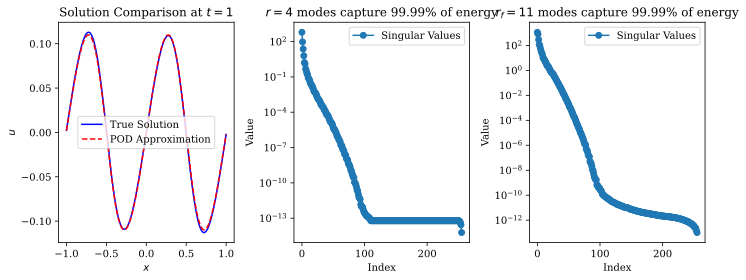

In [4]:
# Parameters
c = 1  # Advection speed
N = 2**8  # Number of grid points
dt, Tf = 1e-3, 1  # Time step and final time
t_eval = np.arange(0, Tf, dt)  # Time evaluation points

# Generate finite difference matrices and grid points
D1, D2, _, _, xp, dx = Grid_FD(-1, 1, N, "P", "P")

# Initial condition
u0 = np.sin(2 * np.pi * xp)

# Define the right-hand side (RHS) of the PDE
RHS = lambda t, u, nu: -c * 0.5 * D1 @ u**2 + nu * D2 @ u

# Discretize nu and generate snapshots
Snapshots, Snapshots_F = [], []
for nu in np.linspace(0.01, 0.05, 10):
    Snapshot = solve_ivp(RHS, (0, Tf), u0, args=(nu,), method='RK45', t_eval=t_eval).y
    Snapshots.append(Snapshot.copy())
    Snapshots_F.append(RHS(0, Snapshot, nu))

# Perform Singular Value Decomposition (SVD)
U, S, _ = np.linalg.svd(np.hstack(Snapshots), full_matrices=False)
U_F, S_F, _ = np.linalg.svd(np.hstack(Snapshots_F), full_matrices=False)

# Truncate basis based on 99.99% energy
energy = np.cumsum(S**2) / np.sum(S**2)
r = np.searchsorted(energy, 0.9999) + 1
Phi = U[:, :r]

energy_F = np.cumsum(S_F**2) / np.sum(S_F**2)
r_F = np.searchsorted(energy_F, 0.9999) + 1
Psi = U_F[:, :r_F]

# GPODE algorithm
def GPODE(XI, r):
    G = lambda S: S[-2]**2-S[-1]**2 if XI.shape[1]>1 else S[-1]**2

    I = [np.argmax(np.abs(XI[:,0]))]
    for i in range(1, r):
        if i<XI.shape[1]:        
            res = XI[:,i] - XI[:,:i] @ np.linalg.solve(XI[I,:i], XI[I,i])
            I += [np.argmax(np.abs(res))]
        else:
            _, S, WT = np.linalg.svd(XI[I,:], full_matrices=False)
            g = G(S)
            Ub = WT @ XI.T
            R = g + np.sum(Ub**2, 0)
            R = R - np.sqrt(R**2 - 4*g*Ub[-1,:]**2)
            R[I] = -1
            I += [np.argmax(R)]
    return I

# Generate DEIM indices
p = GPODE(Psi, r_F + 5)

def RHS_r(t, theta, nu):
    f_p = RHS(t, Phi @ theta, nu)[p]
    z = np.linalg.lstsq(Psi[p], f_p, rcond=None)[0]
    return Phi.T @ Psi @ z

# Solve for a new nu
nu_new = 0.05  # Example new nu
theta0 = Phi.T @ u0
theta = solve_ivp(RHS_r, (0, Tf), theta0, args=(nu_new,), method='RK45', t_eval=t_eval).y
u_reconstructed = Phi @ theta

# Calculate error for a specific time frame
time_frame = -1  # Last time frame
u_true = solve_ivp(RHS, (0, Tf), u0, args=(nu_new,), method='RK45', t_eval=[t_eval[time_frame]]).y.flatten()

# Plotting
fig, axs = plt.subplots(1, 3, figsize=(10, 4), tight_layout=True)

# Plot of the true solution vs POD approximation
axs[0].plot(xp, u_true, 'b-', label='True Solution')
axs[0].plot(xp, u_reconstructed[:, time_frame], 'r--', label='POD Approximation')
axs[0].set_xlabel('$x$')
axs[0].set_ylabel('$u$')
axs[0].set_title(f'Solution Comparison at $t={Tf}$')
axs[0].legend()

# Plot of the singular values for snapshots
axs[1].semilogy(S, 'o-', label='Singular Values')
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Value')
axs[1].set_title(f'$r={r}$ modes capture 99.99% of energy')
axs[1].legend()

# Plot of the singular values for snapshot derivatives
axs[2].semilogy(S_F, 'o-', label='Singular Values')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Value')
axs[2].set_title(f'$r_f={r_F}$ modes capture 99.99% of energy')
axs[2].legend()

plt.show()

## Time-Dependent Bases: The TDB-CUR Algorithm

*For a detailed explanation, please refer to the paper [*Oblique projection for scalable rank-adaptive reduced-order modelling of nonlinear stochastic partial differential equations with time-dependent bases*](https://royalsocietypublishing.org/doi/full/10.1098/rspa.2023.0320).*

In traditional Proper Orthogonal Decomposition (POD), the basis functions are assumed to be time-independent, leading to a separation of variables where spatial modes are static over time. However, many solutions to dynamic systems exhibit local behavior in time that static bases cannot efficiently capture. To address this limitation, we introduce **time-dependent basis functions**, allowing for a more accurate representation of solutions that vary significantly over time.

### Representation with Time-Dependent Bases

We aim to approximate the solution of a matrix differential equation using a time-dependent low-rank representation:

$$
\hat{\mathbf{V}}(\mathbf{x}, t, \boldsymbol{\xi}) = \mathbf{U}(\mathbf{x}, t) \boldsymbol{\Sigma}(t) \mathbf{Y}^\top(\boldsymbol{\xi}, t),
$$

where:

- $\hat{\mathbf{V}} \in \mathbb{R}^{n \times s}$ is the rank-$r$ approximation of the solution matrix at time $t$.
- $\mathbf{U}(\mathbf{x}, t) \in \mathbb{R}^{n \times r}$ contains the time-dependent left singular vectors (spatial basis functions).
- $\boldsymbol{\Sigma}(t) \in \mathbb{R}^{r \times r}$ is a diagonal matrix of singular values at time $t$.
- $\mathbf{Y}(\boldsymbol{\xi}, t) \in \mathbb{R}^{s \times r}$ contains the time-dependent right singular vectors (parameters or temporal basis functions).
- $\mathbf{x}$ denotes spatial variables, and $\boldsymbol{\xi}$ represents parameter dependencies.

### Residual and Variational Optimization

When substituting this approximation into the governing partial differential equations (PDEs), the low-rank representation cannot satisfy the full-order model (FOM) exactly, leading to a residual:

$$
\mathbf{R}(t) = \frac{\mathrm{d}}{\mathrm{d} t} \left( \mathbf{U} \boldsymbol{\Sigma} \mathbf{Y}^\top \right) - \mathcal{F}\left( t, \mathbf{U} \boldsymbol{\Sigma} \mathbf{Y}^\top \right),
$$

where $\mathcal{F}$ represents the nonlinear operator derived from the PDEs.

To minimize this residual, we formulate an optimization problem using a variational principle. The objective is to find the time derivatives $\dot{\mathbf{U}}$, $\dot{\boldsymbol{\Sigma}}$, and $\dot{\mathbf{Y}}$ that minimize the Frobenius norm of the residual:

$$
\mathcal{J}(\dot{\mathbf{U}}, \dot{\boldsymbol{\Sigma}}, \dot{\mathbf{Y}}) = \left\| \frac{\mathrm{d}}{\mathrm{d} t} \left( \mathbf{U} \boldsymbol{\Sigma} \mathbf{Y}^\top \right) - \mathcal{F}\left( t, \mathbf{U} \boldsymbol{\Sigma} \mathbf{Y}^\top \right) \right\|_F^2,
$$

subject to the orthonormality constraints on $\mathbf{U}$ and $\mathbf{Y}$:

$$
\mathbf{U}^\top \mathbf{U} = \mathbf{I}, \quad \mathbf{Y}^\top \mathbf{Y} = \mathbf{I}.
$$

This optimization ensures that the basis functions adapt over time to capture the dynamics of the system more effectively.

### Computational Challenges

While the optimal solution involves computing the Singular Value Decomposition (SVD) of the solution matrix $\mathbf{V}$ at each time step, this is computationally expensive due to:

1. **Evaluating the Nonlinear Operator $\mathcal{F}$:**

   Computing $\mathcal{F}\left( t^{k-1}, \hat{\mathbf{V}}^{k-1} \right)$ at each time step to obtain the updated solution $\mathbf{V}^k$ is resource-intensive, especially for large-scale systems.

2. **Performing SVD at Each Time Step:**

   The repeated computation of SVD for high-dimensional matrices $\mathbf{V}^k$ consumes significant computational time and memory.

### The TDB-CUR Algorithm for Efficient Computation

To reduce the computational cost, we utilize techniques from compressed sensing and interpolation, specifically the Discrete Empirical Interpolation Method (DEIM) and CUR decomposition. We approximate the solution using an orthogonal basis $\mathbf{Q}$ and a coefficient matrix $\mathbf{Z}$:

$$
\hat{\mathbf{V}}(\mathbf{x}, t, \boldsymbol{\xi}) = \mathbf{Q}(\mathbf{x}, t) \mathbf{Z}(\boldsymbol{\xi}, t),
$$

where:

- $\mathbf{Q}(\mathbf{x}, t) \in \mathbb{R}^{n \times r}$ is an orthogonal matrix approximating the left singular vectors.
- $\mathbf{Z}(\boldsymbol{\xi}, t) \in \mathbb{R}^{r \times s}$ contains the coefficients.

The **Time-Dependent Basis CUR (TDB-CUR)** algorithm proceeds iteratively at each time step as follows:

#### 1. Index Selection Using DEIM

Compute the index set $\mathbf{q}$ by applying DEIM to the current orthogonal basis $\mathbf{Q}$ from the previous time step:

$$
\mathbf{q} = \operatorname{DEIM}\left( \mathbf{Q} \right).
$$

DEIM efficiently selects representative columns (indices) that capture the essential features of $\mathbf{Q}$.

#### 2. QR Decomposition of Selected Columns

Extract the columns of the solution matrix $\mathbf{V}$ corresponding to indices $\mathbf{q}$ and compute the QR decomposition to update the basis $\mathbf{Q}$:

$$
\mathbf{Q} = \operatorname{QR}\left( \mathbf{V}(:, \mathbf{q}) \right).
$$

This step updates the orthogonal basis to better align with the current solution.

#### 3. Row Index Selection Using DEIM

Apply DEIM again to the updated basis $\mathbf{Q}$ to select a set of row indices $\mathbf{p}$:

$$
\mathbf{p} = \operatorname{DEIM}\left( \mathbf{Q} \right).
$$

This identifies the most informative rows for reconstructing the coefficient matrix.

#### 4. Compute Coefficients via Regression

Using the selected indices, compute the coefficients $\mathbf{Z}$ through a regression (least-squares) approach:

$$
\mathbf{Z} = \mathbf{Q}(\mathbf{p})^\dagger \mathbf{V}(\mathbf{p}, :),
$$

where $\mathbf{Q}(\mathbf{p})^\dagger$ denotes the pseudoinverse of the submatrix formed by the selected rows of $\mathbf{Q}$.

#### 5. SVD of the Coefficient Matrix

Perform SVD on the coefficient matrix $\mathbf{Z}$:

$$
\operatorname{SVD}(\mathbf{Z}) = \mathbf{R} \boldsymbol{\Sigma} \mathbf{Y}^\top,
$$

where:

- $\mathbf{R} \in \mathbb{R}^{r \times r}$ is an orthogonal matrix.
- $\boldsymbol{\Sigma} \in \mathbb{R}^{r \times r}$ contains the singular values.
- $\mathbf{Y} \in \mathbb{R}^{s \times r}$ contains the right singular vectors (updated temporal or parameter basis functions).

#### 6. Update the Left Singular Vectors

Compute the updated left singular vectors $\mathbf{U}$ by rotating the basis $\mathbf{Q}$ with $\mathbf{R}$:

$$
\mathbf{U} = \mathbf{Q} \mathbf{R}.
$$

This aligns the basis $\mathbf{Q}$ with the dominant modes captured in $\mathbf{Z}$, ensuring that $\mathbf{U}$ accurately represents the updated spatial basis functions.

### Advantages of the TDB-CUR Algorithm

- **Reduced Computational Cost:** By focusing on selected rows and columns and working with reduced matrices, the algorithm significantly lowers the computational burden compared to performing full SVD at each time step.
- **Adaptability:** The time-dependent bases adapt to changes in the solution over time, capturing transient behaviors more effectively than static bases.
- **Scalability:** Suitable for large-scale problems where traditional methods become infeasible due to high dimensionality.

## Comparison of DMD, POD, and TDB Methods

In the study of dynamical systems, model reduction techniques are essential for simplifying complex models while retaining their critical features. Three prominent methods in this domain are **Dynamic Mode Decomposition (DMD)**, **Proper Orthogonal Decomposition (POD)**, and **Time-Dependent Basis (TDB)** methods such as the TDB-CUR algorithm. Each method has unique characteristics that make it suitable for specific types of problems.

The following table summarizes the key features of these methods:

| Method | Single Sample | Multiple Samples | Data/Equation Driven | Training Cost | Feature Space | Parametric Space |
|:---|:---:|:---:|:---|:---:|:---:|:---:|
| **DMD** | ✓ | ✗ | Data-Driven | Low | Linear | Linear |
| **POD** | ✓ | ✓ | Equation-Driven | Low | Linear | Linear |
| **TDB** | ✗ | ✓ | Equation-Driven | High | Linear | Linear |

### Key Features Explained

#### Single Sample vs. Multiple Samples

- **Single Sample (✓):**
  - The method can be applied using data from a single experiment or simulation.
- **Multiple Samples (✓):**
  - The method requires or benefits from data collected across multiple experiments, simulations, or parameter variations.

#### Data-Driven vs. Equation-Driven

- **Data-Driven:**
  - The method relies solely on observed data without explicit use of the governing equations.
- **Equation-Driven:**
  - The method uses the governing equations of the system to construct the reduced model.

#### Training Cost

- **Low Training Cost (Low):**
  - The computational effort required to construct the model is relatively small.
- **High Training Cost (High):**
  - The method requires significant computational resources, often due to complex calculations at each time step.

#### Feature Space and Parametric Space

- **Linear:**
  - The method assumes linearity in the feature space (state variables) or parametric space (parameters affecting the system).

## Koopman Operator Theory

Koopman Operator Theory provides a powerful framework for analyzing nonlinear dynamical systems by representing them with linear operators, albeit in infinite-dimensional spaces. The key idea is to lift the state of a nonlinear system into a higher-dimensional space where the dynamics can be described linearly. This approach leverages the Koopman operator, which acts on measurement functions (observables) of the system's state.

### Definition of the Koopman Operator

Consider a nonlinear dynamical system with state $\mathbf{x} \in \mathbb{R}^n$ evolving according to some flow map $\mathbf{F}_t$ over time $t$. The Koopman operator $\mathcal{K}_t$ is an infinite-dimensional linear operator that acts on measurement functions $g: \mathbb{R}^n \rightarrow \mathbb{C}$, which are elements of an infinite-dimensional Hilbert space of observables. The action of the Koopman operator is defined as:

$$
\mathcal{K}_t g = g \circ \mathbf{F}_t,
$$

where:

- $\circ$ denotes the composition of functions.
- $g \circ \mathbf{F}_t$ means that $g$ is evaluated at the future state, $\mathbf{F}_t(\mathbf{x})$.

For a discrete-time system with time-step $\Delta t$, this becomes:

$$
\mathcal{K}_{\Delta t} g(\mathbf{x}_k) = g\big(\mathbf{F}_{\Delta t}(\mathbf{x}_k)\big) = g(\mathbf{x}_{k+1}),
$$

where $\mathbf{x}_{k+1} = \mathbf{F}_{\Delta t}(\mathbf{x}_k)$ represents the state of the system at the next time step.

In essence, the Koopman operator advances the observation of the state from one time step to the next:

$$
g(\mathbf{x}_{k+1}) = \mathcal{K}_{\Delta t} g(\mathbf{x}_k).
$$

This relationship holds for any observable function $g$ and any state $\mathbf{x}_k$. By shifting focus from the state space to the space of observables, the Koopman operator provides a linear but infinite-dimensional description of the nonlinear dynamics.

### Koopman Eigenfunctions

A central concept in Koopman Operator Theory is that of Koopman eigenfunctions. These are special observables that evolve linearly over time under the action of the Koopman operator, despite the underlying dynamics being nonlinear. A Koopman eigenfunction $\varphi: \mathbb{R}^n \rightarrow \mathbb{C}$ associated with eigenvalue $\lambda$ satisfies:

$$
\varphi(\mathbf{x}_{k+1}) = \mathcal{K}_{\Delta t} \varphi(\mathbf{x}_k) = \lambda \varphi(\mathbf{x}_k).
$$

This means that over each time step $\Delta t$, the Koopman eigenfunction is simply scaled by the eigenvalue $\lambda$. The set of all Koopman eigenfunctions provides a way to linearly describe the evolution of observables in the system.

### Practical Implementation and Challenges

While the Koopman operator offers a linear perspective on nonlinear systems, it is infinite-dimensional, making direct computation infeasible. Practical applications focus on approximating the Koopman operator using finite-dimensional representations. Techniques such as Dynamic Mode Decomposition (DMD) approximate the Koopman operator by projecting it onto a subspace spanned by data-driven modes.

**Challenges include:**

- **Infinite Dimensionality:** The Koopman operator operates on an infinite-dimensional space of observables, making exact computation impossible.
- **Choice of Observables:** Selecting appropriate measurement functions $g$ is non-trivial. The observables must capture the essential dynamics of the system.
- **Computational Complexity:** Even approximate methods like DMD can become computationally intensive for high-dimensional systems.

Despite these challenges, the Koopman framework has been successfully applied in various fields, including fluid dynamics, robotics, and neuroscience, offering insights into system behavior and facilitating control and prediction.

## Sparse Identification of Nonlinear Dynamics (SINDy)

The Sparse Identification of Nonlinear Dynamics (SINDy) method is a data-driven approach for discovering governing equations of dynamical systems directly from measurement data. It addresses the challenge of model selection by assuming that most dynamical systems have only a few active terms governing their behavior, even though there may be a vast number of possible candidate functions.

### Methodology

SINDy aims to identify the underlying dynamical system:

$$
\dot{\mathbf{x}} = \mathbf{f}(\mathbf{x}),
$$

where $\mathbf{x} \in \mathbb{R}^n$ is the state vector and $\mathbf{f}(\mathbf{x})$ governs the dynamics. The key steps are:

1. **Data Collection:**

   Collect time-series data of the state and its time derivatives:

   $$
   \begin{aligned}
   \mathbf{X} &= \begin{bmatrix} \mathbf{x}(t_1)^\top \\ \mathbf{x}(t_2)^\top \\ \vdots \\ \mathbf{x}(t_m)^\top \end{bmatrix} \in \mathbb{R}^{m \times n}, \\
   \dot{\mathbf{X}} &= \begin{bmatrix} \dot{\mathbf{x}}(t_1)^\top \\ \dot{\mathbf{x}}(t_2)^\top \\ \vdots \\ \dot{\mathbf{x}}(t_m)^\top \end{bmatrix} \in \mathbb{R}^{m \times n},
   \end{aligned}
   $$

   where $m$ is the number of time samples.

2. **Construct a Library of Candidate Functions:**

   Build a library $\boldsymbol{\Phi}(\mathbf{X})$ consisting of candidate functions evaluated at the measured data:

   $$
   \boldsymbol{\Phi}(\mathbf{X}) = \begin{bmatrix} \boldsymbol{\phi}_1(\mathbf{X}) & \boldsymbol{\phi}_2(\mathbf{X}) & \cdots & \boldsymbol{\phi}_p(\mathbf{X}) \end{bmatrix} \in \mathbb{R}^{m \times p},
   $$

   where each $\boldsymbol{\phi}_i(\mathbf{X})$ is a vector resulting from applying a candidate function to all samples. Examples of candidate functions include polynomials, trigonometric functions, and other nonlinear functions:

   - Constant term: $1$
   - Linear terms: $\mathbf{X}$
   - Quadratic terms: $\mathbf{X}^{[2]}$ (all combinations of products of state variables)
   - Higher-order polynomials: $\mathbf{X}^{[d]}$
   - Trigonometric functions: $\sin(\mathbf{X})$, $\cos(\mathbf{X})$

3. **Formulate the Regression Problem:**

   Assume that the dynamics can be approximated as a linear combination of the candidate functions:

   $$
   \dot{\mathbf{X}} = \boldsymbol{\Phi}(\mathbf{X}) \boldsymbol{\Theta},
   $$

   where $\boldsymbol{\Theta} \in \mathbb{R}^{p \times n}$ is the matrix of coefficients we aim to determine.

4. **Sparse Regression:**

   Solve for the coefficient matrix $\boldsymbol{\Theta}$ using sparse regression to promote models with few active terms:

   $$
   \boldsymbol{\Theta} = \arg \min_{\boldsymbol{\Theta}'} \left( \left\| \dot{\mathbf{X}} - \boldsymbol{\Phi}(\mathbf{X}) \boldsymbol{\Theta}' \right\|_F^2 + \lambda \left\| \boldsymbol{\Theta}' \right\|_1 \right ),
   $$

   where:

   - $\left\| \cdot \right\|_F$ denotes the Frobenius norm.
   - $\left\| \boldsymbol{\Theta}' \right\|_1$ is the $\ell_1$ norm of $\boldsymbol{\Theta}'$, promoting sparsity.
   - $\lambda$ is a regularization parameter that balances fit and sparsity.

   Sparse regression methods like the Least Absolute Shrinkage and Selection Operator (LASSO) are employed to efficiently find a sparse solution.

5. **Model Synthesis:**

   The non-zero entries in $\boldsymbol{\Theta}$ indicate the active terms in the dynamics. The identified model is then:

   $$
   \dot{\mathbf{x}} = \boldsymbol{\Phi}(\mathbf{x}) \boldsymbol{\Theta}.
   $$

### Connection to DMD

Dynamic Mode Decomposition (DMD) is a linear regression technique used to identify linear dynamics from data. If we limit the candidate library $\boldsymbol{\Phi}(\mathbf{X})$ to only linear terms and set the regularization parameter $\lambda = 0$, the SINDy method reduces to standard least-squares regression, akin to DMD. However, without regularization, the solution may include all candidate terms due to noise and overfitting, leading to non-physical models. Introducing sparsity through $\lambda > 0$ in SINDy helps mitigate this issue.

### Advantages of SINDy

- **Parsimony:** By promoting sparsity, SINDy identifies the simplest possible model that explains the data, aiding interpretability.
- **Flexibility:** The method can handle a wide range of candidate functions, making it suitable for various types of systems.
- **Scalability:** Sparse regression scales well with the number of candidate functions, allowing for efficient computation even with large libraries.
- **Robustness to Noise:** Sparse regression techniques can be more robust to measurement noise compared to standard least-squares methods.

### Practical Considerations

- **Choice of Candidate Functions:** The library $\boldsymbol{\Phi}(\mathbf{X})$ should be rich enough to capture the system dynamics but not so large as to make computation intractable.
- **Regularization Parameter ($\lambda$):** Selecting an appropriate $\lambda$ is crucial. Cross-validation or information criteria can be used to choose $\lambda$ that balances model complexity and predictive performance.
- **Derivative Computation:** Estimating $\dot{\mathbf{X}}$ accurately from data is important. Numerical differentiation can amplify noise, so methods like smoothing or direct estimation of derivatives from data may be necessary.

### Example

Suppose we have a dynamical system in two variables:

$$
\begin{aligned}
\dot{x}_1 &= -\sigma x_1 + \sigma x_2, \\
\dot{x}_2 &= r x_1 - x_2 - x_1 x_3, \\
\dot{x}_3 &= x_1 x_2 - b x_3,
\end{aligned}
$$

where $\sigma$, $r$, and $b$ are constants. We collect time-series data of $\mathbf{x} = [x_1, x_2, x_3]^\top$ and construct a library including terms like $x_1 x_2$, $x_1 x_3$, etc. Applying SINDy, we can recover the underlying equations and identify the active terms corresponding to the parameters $\sigma$, $r$, and $b$.